In [1]:
%load_ext autoreload
%autoreload 2
# Above we are adding this autoreload magic command, so we can make changes to tms and it will load them correctly
import warnings
from collections import defaultdict
import matplotlib.pyplot as plt
import matplotlib.cm as cm

import numpy as np
import pandas as pd
from scipy.spatial import ConvexHull
import torch
import torch.nn as nn
import os
from typing import List, Dict, Any, Tuple

from tms.utils.utils import load_results, get_first, iterate_container
from tms.training.experiments import run_experiments
from tms.utils.utils import generate_sparsity_values
from tms.data.dataset import SyntheticBinaryValued
from tms.models.autoencoder import ToyAutoencoder
from tms.llc import estimate_llc, get_llc_data, preaggregate_llc
from tms.plots.kgons import plot_losses_and_polygons
from tms.plots.losses import compare_dataframes_and_results

In [ ]:
def get_or_create_preaggregated_llc_csv(results, version: str, data_dir: str) -> pd.DataFrame:
    """Load preaggregated LLC values from CSV, or generate and save them."""
    preagg_path = os.path.join(data_dir, f"llc_preagg_{version}.csv")
    
    if os.path.exists(preagg_path):
        print(f"Loading preaggregated LLC from {preagg_path}")
        return pd.read_csv(preagg_path)
    
    print("Preaggregated file not found — computing from raw results...")
    llc_estimates = get_llc_data(results, version, data_dir)

    # Preaggregate (returns dict), convert to DataFrame for CSV
    preagg = preaggregate_llc(llc_estimates)
    preagg_df = pd.DataFrame([
        {'index': k[0], 'batch_size': k[1], 'lr': k[2], 'snapshot_index': k[3], 'llc': v}
        for k, v in preagg.items()
    ])

    print(f"Saving preaggregated LLC to {preagg_path}")
    preagg_df.to_csv(preagg_path, index=False)

    return preagg_df

In [3]:


version = "1.8.0"
data_path = "../data/"
results_1_8= load_results(data_path, version)
llc_estimates_1_8 = get_or_create_preaggregated_llc_csv(results_1_8, version, data_path)

version = "1.7.0"
data_path = "../data/"
results_1_7= load_results(data_path, version)
llc_estimates_1_7 = get_or_create_preaggregated_llc_csv(results_1_7, version, data_path)

version = "1.11.0"
data_path = "../data/"
results_1_11= load_results(data_path, version)
llc_estimates_1_11 = get_or_create_preaggregated_llc_csv(results_1_11, version, data_path)

version = "1.12.0"
data_path = "../data/"
results_1_12= load_results(data_path, version)
llc_estimates_1_12 = get_or_create_preaggregated_llc_csv(results_1_12, version, data_path)

version = "1.13.0"
data_path = "../data/"
results_1_13= load_results(data_path, version)
llc_estimates_1_13 = get_or_create_preaggregated_llc_csv(results_1_13, version, data_path)

version = "1.14.0"
data_path = "../data/"
results_1_14= load_results(data_path, version)
llc_estimates_1_14 = get_or_create_preaggregated_llc_csv(results_1_14, version, data_path)

version = "1.15.0"
data_path = "../data/"
results_1_15= load_results(data_path, version)
llc_estimates_1_15 = get_or_create_preaggregated_llc_csv(results_1_15, version, data_path)


Loading preaggregated LLC from ../data/llc_preagg_1.8.0.csv
Loading preaggregated LLC from ../data/llc_preagg_1.7.0.csv
Loading preaggregated LLC from ../data/llc_preagg_1.11.0.csv
Loading preaggregated LLC from ../data/llc_preagg_1.12.0.csv
Loading preaggregated LLC from ../data/llc_preagg_1.13.0.csv
Loading preaggregated LLC from ../data/llc_preagg_1.14.0.csv
Loading preaggregated LLC from ../data/llc_preagg_1.15.0.csv


In [17]:
results_1_15[0]['parameters'].keys()

dict_keys(['m', 'n', 'num_samples', 'num_samples_test', 'batch_size', 'num_epochs', 'sparsity', 'lr', 'momentum', 'weight_decay', 'init_kgon', 'no_bias', 'init_zerobias', 'prior_std', 'seed', 'use_optimal_solution', 'data_generating_class', 'log_ivl'])

In [ ]:
results_1_15[0]['parameters']['version']

KeyError: 'version'

In [ ]:
results_random_init = results_1_15
llc_estimates_random_init = llc_estimates_1_15

results_optimal_init = results_1_14
llc_estimates_optimal_init = llc_estimates_1_14

Batch size: 300, Learning rate: 0.001



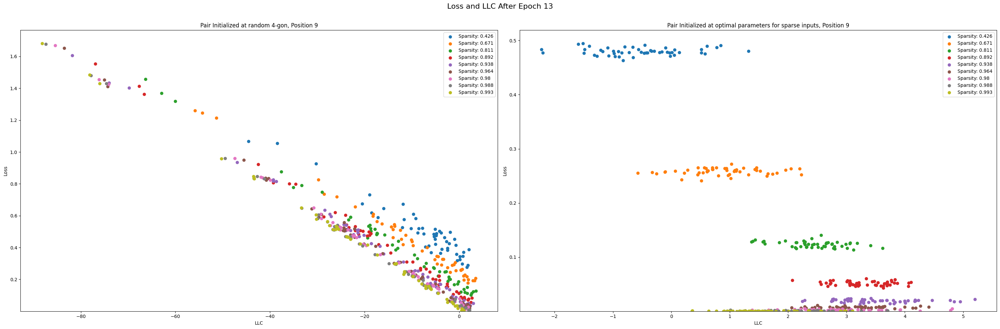

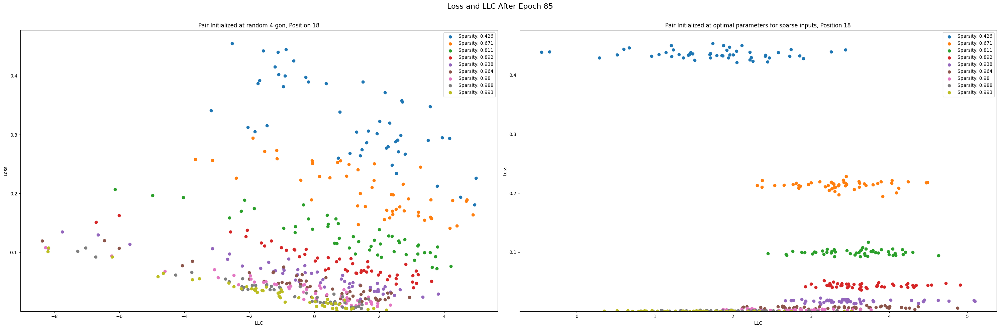

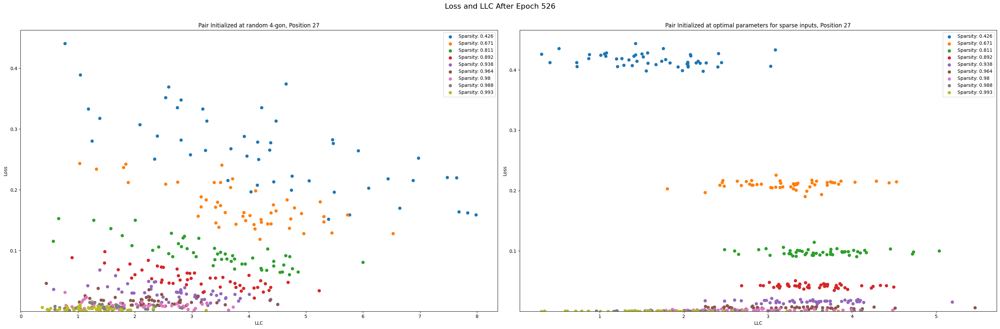

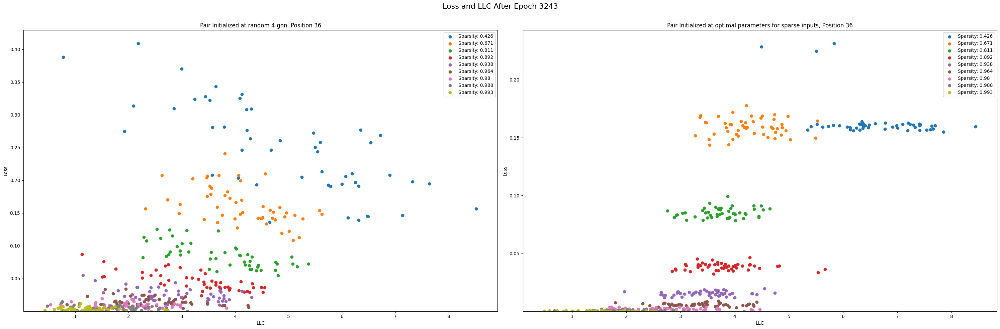

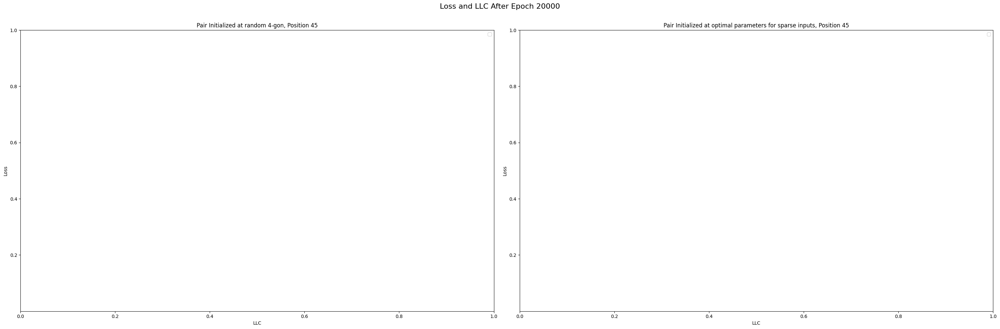

In [19]:

compare_dataframes_and_results(
    [(llc_estimates_1_8, results_1_8), (llc_estimates_1_7, results_1_7)]
)

Batch size: 300, Learning rate: 0.001



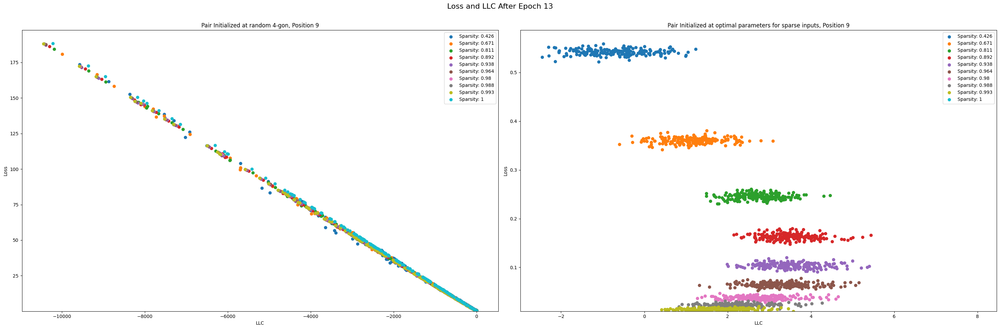

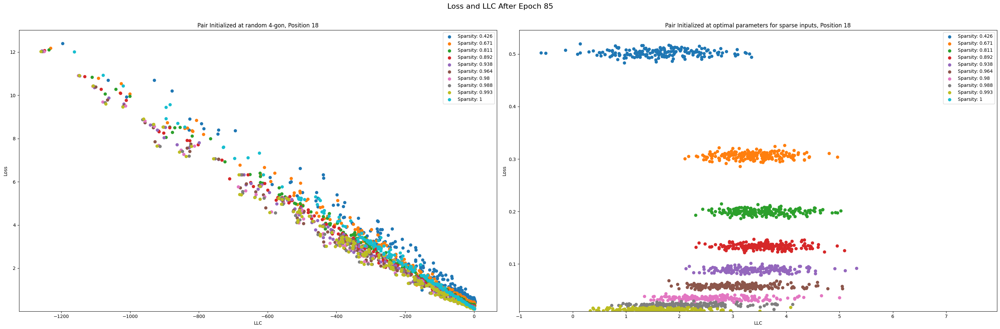

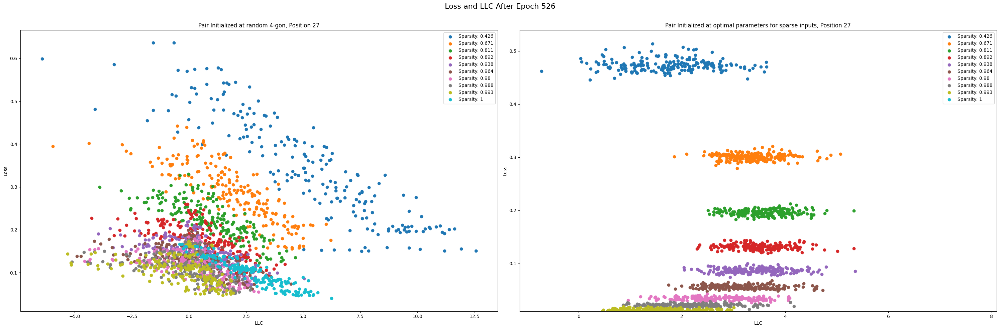

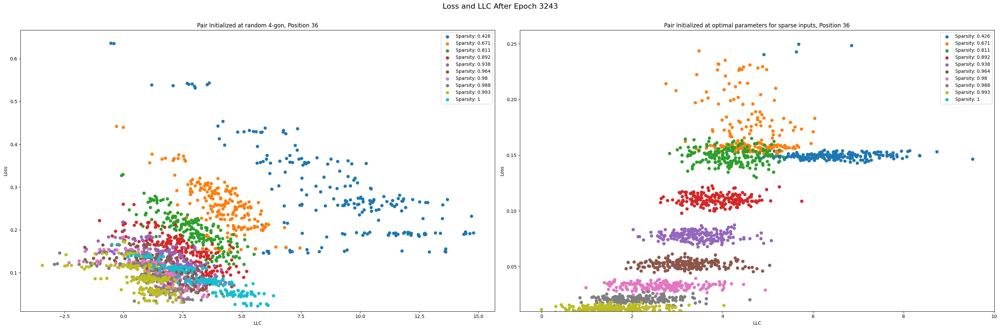

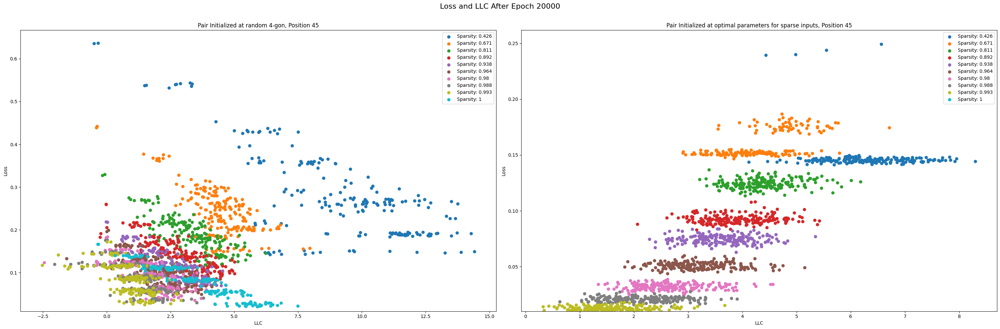

In [28]:
compare_dataframes_and_results([(llc_estimates_1_13, results_1_13), (llc_estimates_1_14, results_1_14)], hyperparam_combos=[(300, 0.001)],ymin=1e-2)

- lower left is not really nicely visible. 
- Pair of plots for epoch, inside different sparsity
- we could also do different sparsities as plots and epochs as colors

What are observations we make:
- there seem to be clusters of loss levels, 

Observation:
- there is a transition for sparsity 0.67. Hypothesis: Instead of directions it is encoding averages. (Note, it seems the toy models of superposition paper is saying actually something slightly differnet with their prediction?)
- competing predictions: you can either get lower loss by only representing a subset of the features, or you can get a lower loss by predicting all of them. (How do we figure out which one makes more sense?)

Batch size: 300, Learning rate: 0.001



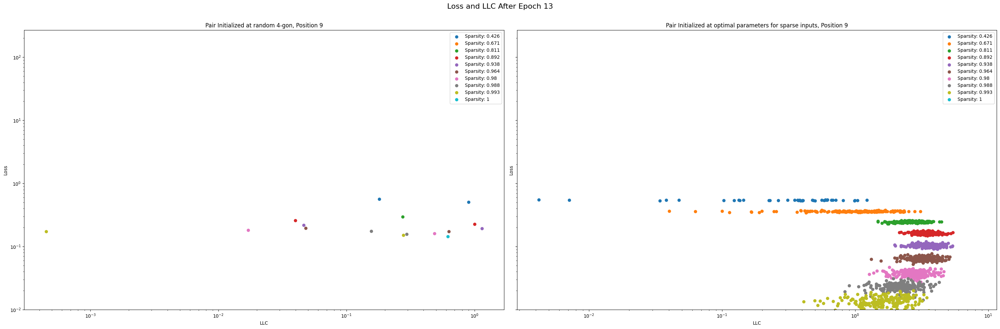

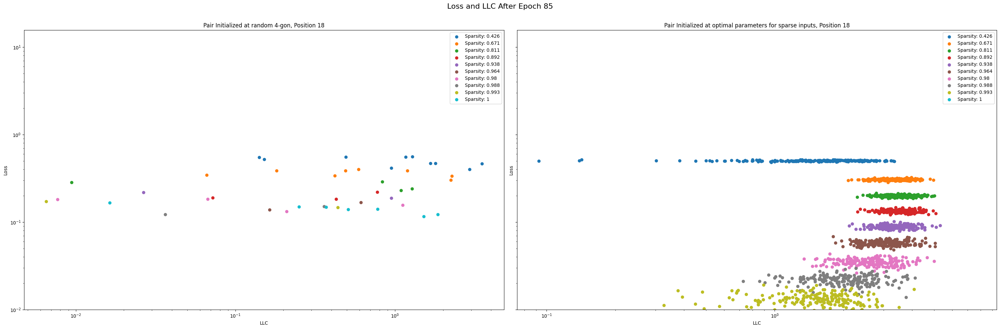

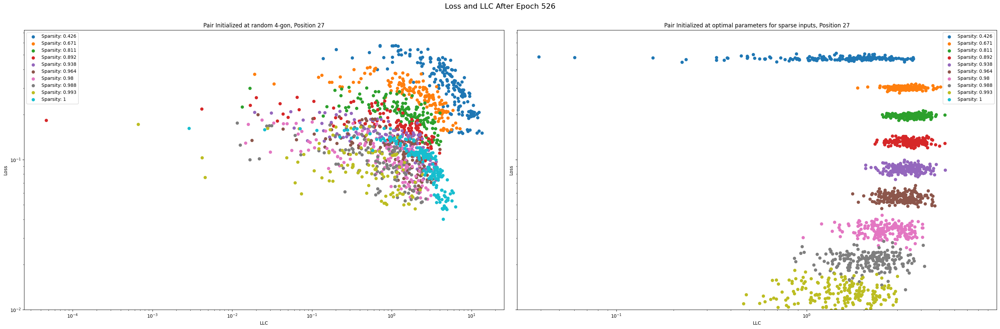

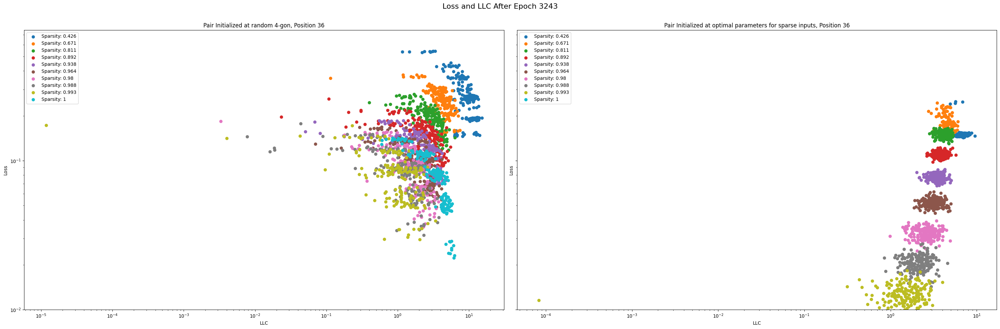

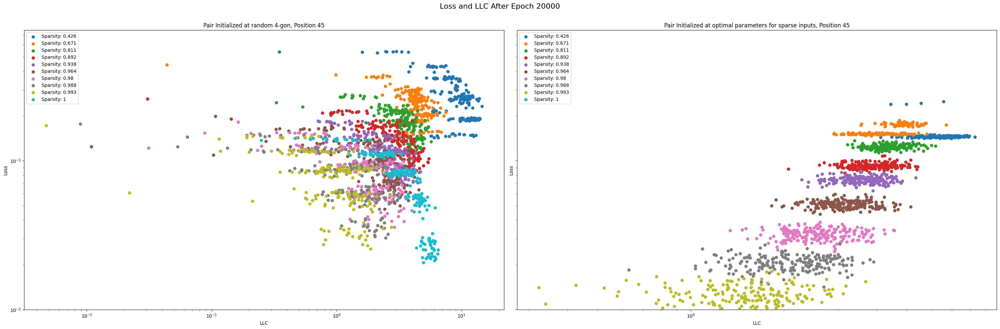

In [ ]:

compare_dataframes_and_results([(llc_estimate_random_init, results_random_init), (llc_estimates_optimal_init, results_optimal_init)], hyperparam_combos=[(300, 0.001)],x_scale="log",  y_scale="log", sharey=True, ymin=1e-2)

Batch size: 300, Learning rate: 0.001



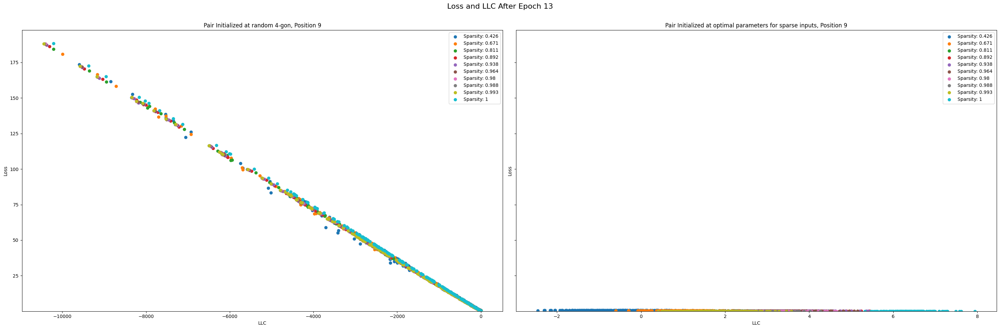

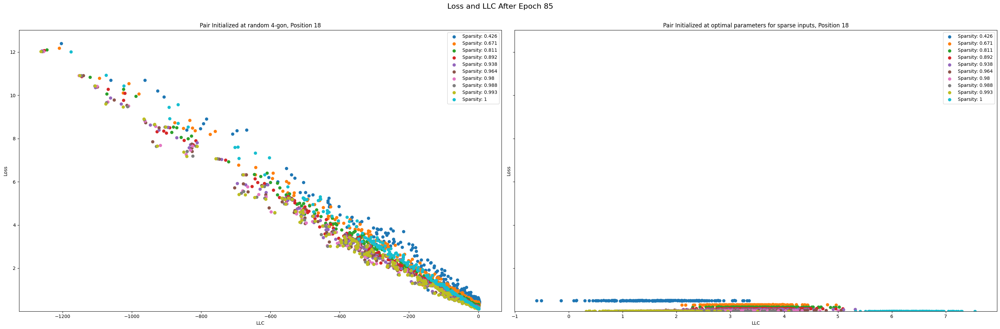

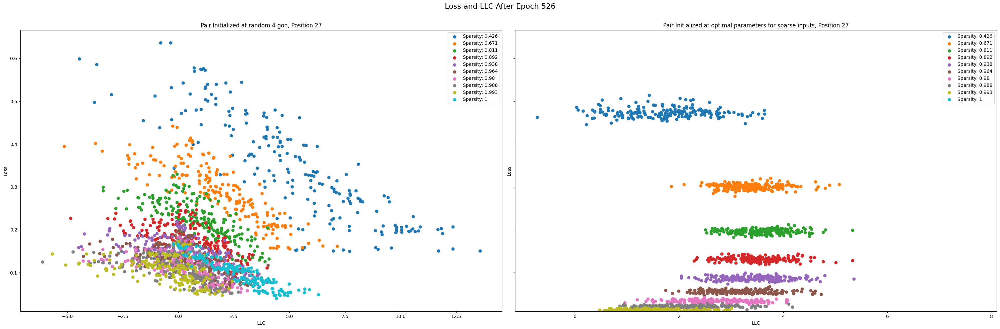

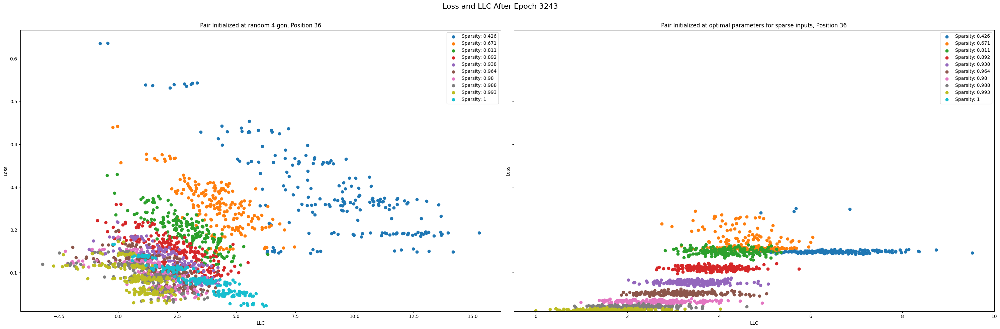

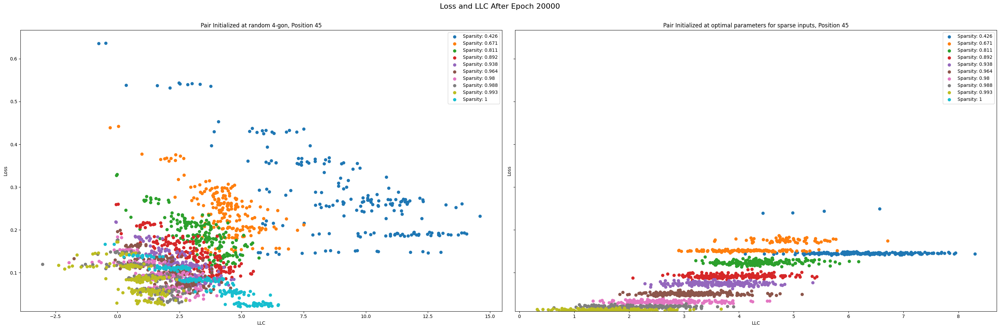

In [12]:
compare_dataframes_and_results([(llc_estimates_random_init, results_random_init), (llc_estimates_optimal_init, results_optimal_init)], hyperparam_combos=[(300, 0.001)], y_scale="linear", sharey=True, ymin=1e-2)

In [30]:
def plot_results(results, plot_number =5, step =-1, loss_window = (0.14, .16), weird_indices = [], sparsities= [0.426, 0.671, 0.811, 0.892, 0.938, 0.964, 0.98 , 0.988, 0.993], epsilon=0.001):
    # loss_hist = []
    for sparse_value in sparsities:
        plotted =0
        print(f"Plot polygons for sparsity={sparse_value}")
        for index in range(len(results)):
            
            STEPS = results[index]['parameters']['log_ivl']
            logs = results[index]['logs']
            losses = [logs.loc[logs['step'] == s, 'loss'].values[0] for s in STEPS]
            
            outside_loss_window = losses[step] < loss_window[0] or losses[step] > loss_window[1]
            non_matching_sparsity = abs(results[index]['parameters']['sparsity'] - sparse_value) > epsilon
            if non_matching_sparsity or outside_loss_window:
                continue
            else:
                if plotted>=plot_number:
                    continue
                plotted+=1

            print(f"Loss: {losses[step]}")

            NUM_EPOCHS = 20000
            PLOT_STEPS = [min(STEPS, key=lambda s: abs(s-i)) for i in [0, 200, 2000, 10000, NUM_EPOCHS - 1]]
            PLOT_INDICES = [STEPS.index(s) for s in PLOT_STEPS]
            Ws = [results[index]['weights'][i]['embedding.weight'] for i in PLOT_INDICES]
            biases = [results[index]['weights'][i]['unembedding.bias'] for i in PLOT_INDICES]
            
            model = ToyAutoencoder(6, 2, final_bias=True)
            new_weights ={}
            for idx, ndarray in results[index]['weights'][PLOT_INDICES[-1]].items():
                new_weights[idx] = torch.from_numpy(ndarray)

            # criterion=nn.MSELoss()
        
            # model.load_state_dict(new_weights)

            # # print(sample)
            # # print(model(sample))
            # test_set = SyntheticBinaryValued(10000, 6, sparse_value)
            # mean_loss_test = 0
            # for sample in test_set:
            #     output = model(sample)
            #     mean_loss_test += criterion(output, sample)
            # # print("Mean loss test:")
            # loss_hist.append(mean_loss_test)
            # print(f"index: {index}")
            # print(mean_loss_test/10000)
            # # if mean_loss_test<20:
            # #     continue
            # # else:
            # #     weird_indices.append(index)
            

            #all_weights = [[results[j]['weights'][i] for i in PLOT_INDICES] for j in range(len(results))]
            plot_losses_and_polygons(STEPS, losses, PLOT_STEPS, Ws, biases)
            plt.show()

One thing we observe is that even in the non-sparse regime, we see different types of local solutions that models get stuck on.


In [13]:
plot_results(results_random_init, plot_number=5, loss_window=(.6,1), sparsities=[0.426])

NameError: name 'plot_results' is not defined

In [14]:
plot_results(results_optimal_init, plot_number=5, loss_window=(.6,1), sparsities=[0.426])

NameError: name 'plot_results' is not defined

It is interesting, how for both std = 1 and std = 10, we get the same results? What is up with this weird prior parameter? Why is it so important?

In [15]:

print("random init results")
plot_results(results_random_init, plot_number=5, loss_window=(.5,.6), sparsities=[0.426])
print("optimal init results")
plot_results(results_optimal_init, plot_number=5, loss_window=(.5,.6), sparsities=[0.426])

random init results


NameError: name 'plot_results' is not defined

In [16]:
from tms.llc import estimate_llc
from tms.utils.utils import get_first
from torch.utils.data import TensorDataset

from tms.llc import sweep_lambdahat_estimation_hyperparams

# Pick a specific run (e.g. first one with a reasonable sparsity)
result = results_optimal_init[0]
sparsity = result['parameters']['sparsity']
m = result['parameters']['m']
n = result['parameters']['n']
model = ToyAutoencoder(m, n, final_bias=True)

# Load final weights
#model.load_state_dict({k: torch.tensor(v) for k, v in result['weights'][-1].items()})

# Reconstruct the dataset (based on stored parameters)
dataset = SyntheticBinaryValued(num_samples=1000, num_features=m, sparsity=sparsity)

dataset_double = TensorDataset(dataset.data, dataset.data)
# TODO: do we need to also include the priors here?

# Estimate LLC (you can vary t_sgld and batch size/lr as needed)
lambdahat_sweep_df = sweep_lambdahat_estimation_hyperparams(
    model=model,
    dataset=dataset_double,
    weights=result['weights'],
)

print(lambdahat_sweep_df.head())


Sweeping hyperparameters:   0%|          | 0/20 [00:00<?, ?it/s]/home/tassilo/.cache/pypoetry/virtualenvs/tms-kaEgiGsJ-py3.11/lib/python3.11/site-packages/devinterp/utils.py:74: RuntimeWarning: divide by zero encountered in scalar divide
  return dataloader.batch_size / np.log(dataloader.batch_size)
/home/tassilo/.cache/pypoetry/virtualenvs/tms-kaEgiGsJ-py3.11/lib/python3.11/site-packages/devinterp/utils.py:74: RuntimeWarning: divide by zero encountered in scalar divide
  return dataloader.batch_size / np.log(dataloader.batch_size)
Sweeping hyperparameters:   0%|          | 0/20 [00:04<?, ?it/s]


KeyboardInterrupt: 

In [92]:
results_random_init[0]['weights'][-1]

{'embedding.weight': array([[-1.7692755e+00,  9.2687439e-03,  8.9991041e-02,  2.4882656e-02,
          1.7680159e-01,  1.5124735e-02],
        [ 1.1742773e-01,  2.0920173e-03,  1.3579466e+00,  4.1153538e-04,
          2.6423430e+00, -2.1318257e-02]], dtype=float32),
 'unembedding.weight': array([[-1.7692755e+00,  1.1742773e-01],
        [ 9.2687439e-03,  2.0920173e-03],
        [ 8.9991041e-02,  1.3579466e+00],
        [ 2.4882656e-02,  4.1153538e-04],
        [ 1.7680159e-01,  2.6423430e+00],
        [ 1.5124735e-02, -2.1318257e-02]], dtype=float32),
 'unembedding.bias': array([-2.0856352 ,  0.6550206 , -4.4433694 ,  0.67647177, -9.5906725 ,
         0.7164469 ], dtype=float32)}

In [93]:
results_optimal_init[0]['weights'][-1]

{'embedding.weight': array([[-1.7692755e+00,  9.2687439e-03,  8.9991041e-02,  2.4882656e-02,
          1.7680159e-01,  1.5124735e-02],
        [ 1.1742773e-01,  2.0920173e-03,  1.3579466e+00,  4.1153538e-04,
          2.6423430e+00, -2.1318257e-02]], dtype=float32),
 'unembedding.weight': array([[-1.7692755e+00,  1.1742773e-01],
        [ 9.2687439e-03,  2.0920173e-03],
        [ 8.9991041e-02,  1.3579466e+00],
        [ 2.4882656e-02,  4.1153538e-04],
        [ 1.7680159e-01,  2.6423430e+00],
        [ 1.5124735e-02, -2.1318257e-02]], dtype=float32),
 'unembedding.bias': array([-2.0856352 ,  0.6550206 , -4.4433694 ,  0.67647177, -9.5906725 ,
         0.7164469 ], dtype=float32)}

In [87]:

from tms.llc import estimate_llc
from tms.utils.utils import get_first
from torch.utils.data import TensorDataset

from tms.llc import sweep_lambdahat_estimation_hyperparams

# Pick a specific run (e.g. first one with a reasonable sparsity)
result = results_random_init[0]
sparsity = result['parameters']['sparsity']
m = result['parameters']['m']
n = result['parameters']['n']
model = ToyAutoencoder(m, n, final_bias=True)

# Load final weights
#model.load_state_dict({k: torch.tensor(v) for k, v in result['weights'][-1].items()})

# Reconstruct the dataset (based on stored parameters)
dataset = SyntheticBinaryValued(num_samples=1000, num_features=m, sparsity=sparsity)

dataset_double = TensorDataset(dataset.data, dataset.data)
# TODO: do we need to also include the priors here?

# Estimate LLC (you can vary t_sgld and batch size/lr as needed)
lambdahat_sweep_df_random = sweep_lambdahat_estimation_hyperparams(
    model=model,
    dataset=dataset_double,
    weights=result['weights'],
)

print(lambdahat_sweep_df_random.head())


Sweeping hyperparameters:   0%|          | 0/20 [00:00<?, ?it/s]/home/tassilo/.cache/pypoetry/virtualenvs/tms-kaEgiGsJ-py3.11/lib/python3.11/site-packages/devinterp/utils.py:74: RuntimeWarning: divide by zero encountered in scalar divide
  return dataloader.batch_size / np.log(dataloader.batch_size)
Sweeping hyperparameters: 100%|██████████| 20/20 [03:46<00:00, 11.33s/it]


   llc  llc/std  batch_size       lr  t_sgld llc_type      loss  \
0  NaN      NaN           1  0.00001       0     mean  0.213910   
1 -inf      NaN           1  0.00001       0        0  0.174575   
2 -inf      NaN           1  0.00001       0        1  0.117723   
3 -inf      NaN           1  0.00001       0        2  0.067735   
4 -inf      NaN           1  0.00001       0        3  0.164303   

   snapshot_index  
0              -1  
1              -1  
2              -1  
3              -1  
4              -1  


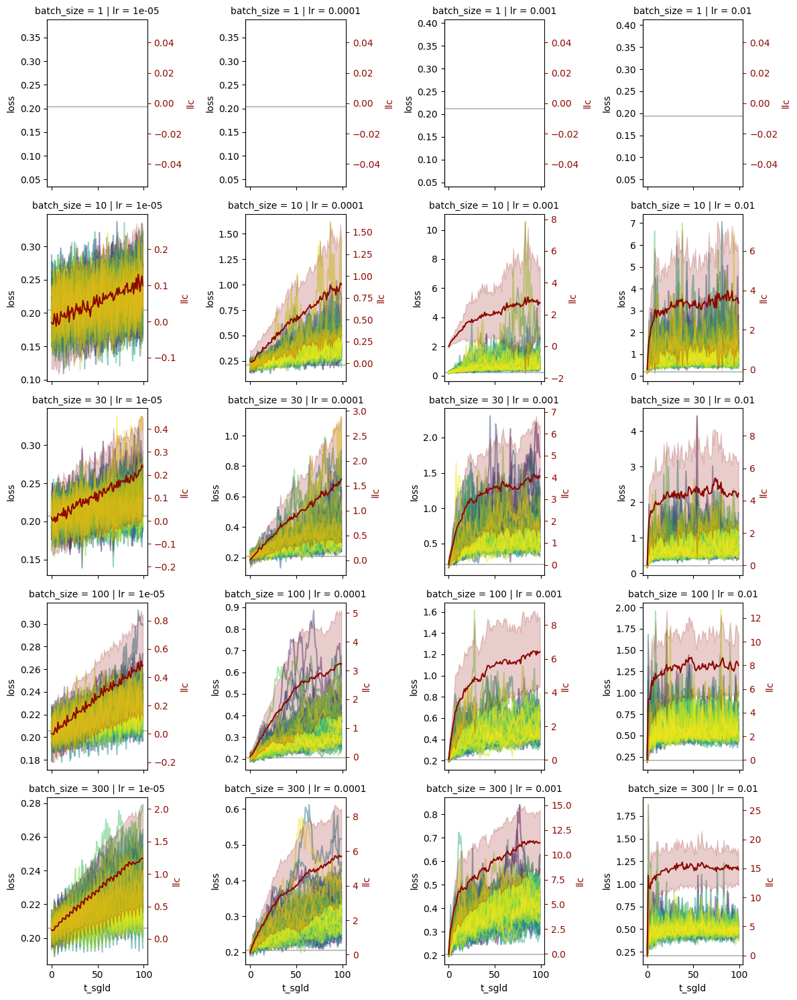

In [85]:

# Plot SGLD hyperparameter grid sweep

import seaborn as sns

def plot_lambdahat_estimation_hyperparams(observations_df):
    def plot_losses(data, **kwargs):
        if kwargs["label"] == "mean":
            plt.axhline(data.loc[data.t_sgld == 0, "loss"].values[0], color="grey", alpha=0.5)
            return

        _data = data.loc[data.llc_type != "mean"]
        sns.lineplot(_data, x="t_sgld", y="loss", **kwargs, alpha=0.5)

    def plot_llcs(data, **kwargs):
        if kwargs["label"] != "mean":
            return
        _data = data.loc[data.llc_type == "mean"]
        ax = plt.twinx()
        kwargs.pop("color")
        color = sns.color_palette("dark")[3]
        ax.plot(_data['t_sgld'], _data['llc'], color=color, **kwargs)
        ax.fill_between(_data['t_sgld'], _data['llc'] - _data['llc/std'], _data['llc'] + _data['llc/std'], color=color, alpha=0.2)
        ax.set_ylabel("llc", color=color)
        ax.tick_params(axis='y', colors=color)

    g = sns.FacetGrid(observations_df, col="lr", row="batch_size", hue="llc_type", palette="viridis", sharey=False)
    g.map_dataframe(plot_losses)
    g.map_dataframe(plot_llcs)

    g.figure.set_facecolor('white')
    g.figure.tight_layout()

    plt.show()

plot_lambdahat_estimation_hyperparams(lambdahat_sweep_df)

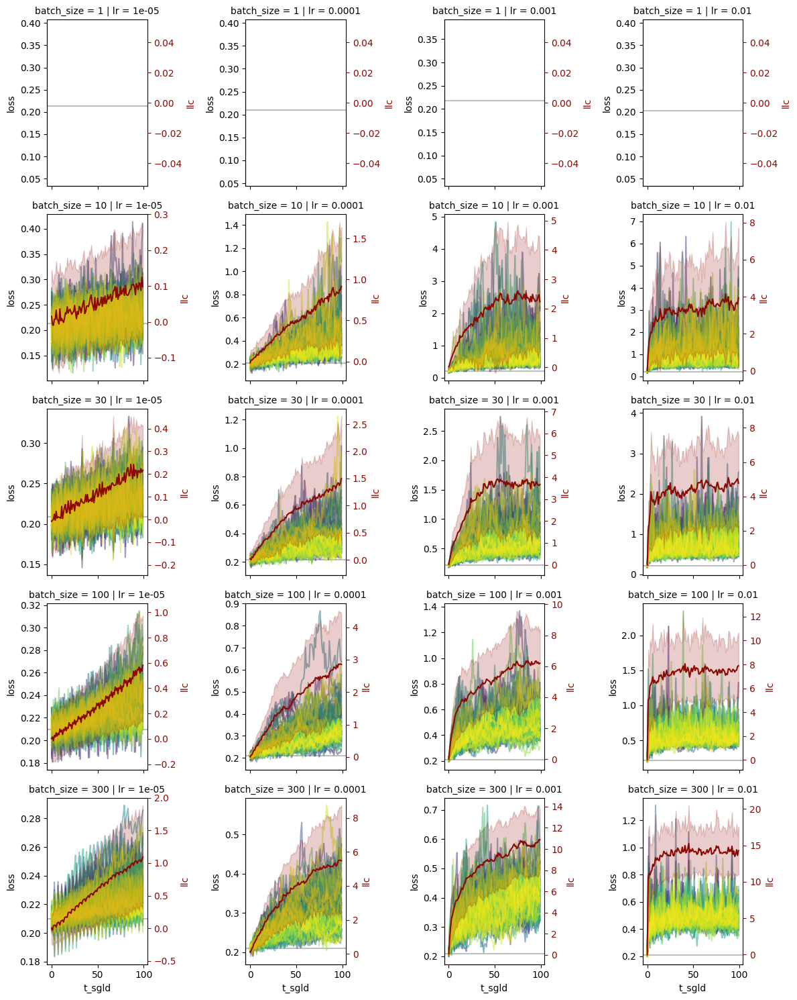

In [88]:
plot_lambdahat_estimation_hyperparams(lambdahat_sweep_df_random)

In [ ]:
compare_dataframes_and_results([(llc_estimates_random_init, results_random_init), (llc_estimates_optimal_init, results_optimal_init)], hyperparam_combos=[(300, 0.001)], y_scale="linear", ymin=1e-2, sharey=True)

In [ ]:
plot_results(results_random_init, plot_number=5, loss_window=(.6,1), sparsities=[0.426])

In [ ]:
llc_estimates_random_init

In [9]:
(.5+.75)/2
(.5+.75)/2

0.625

In [29]:
plot_results(results_1_13, plot_number=5, loss_window=(.63,1), sparsities=[0.426])

NameError: name 'plot_results' is not defined

Plot polygons for sparsity=0.426
Loss: 0.54052734375


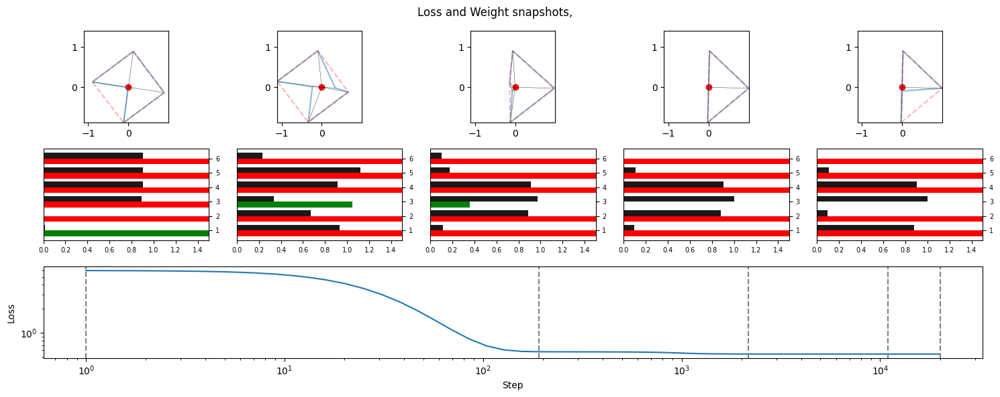

Loss: 0.5437825918197632


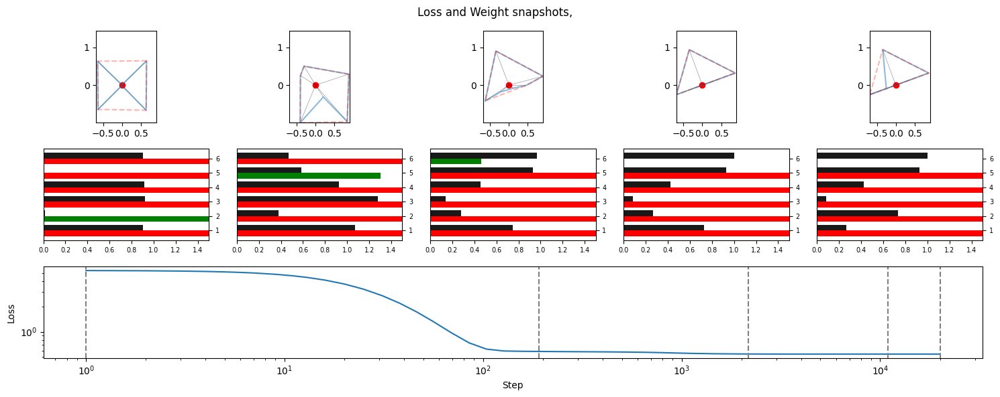

Loss: 0.53759765625


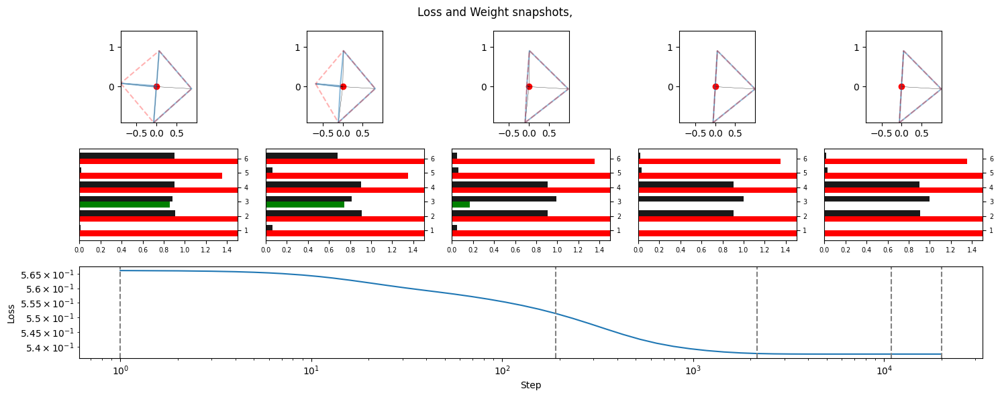

Loss: 0.53857421875


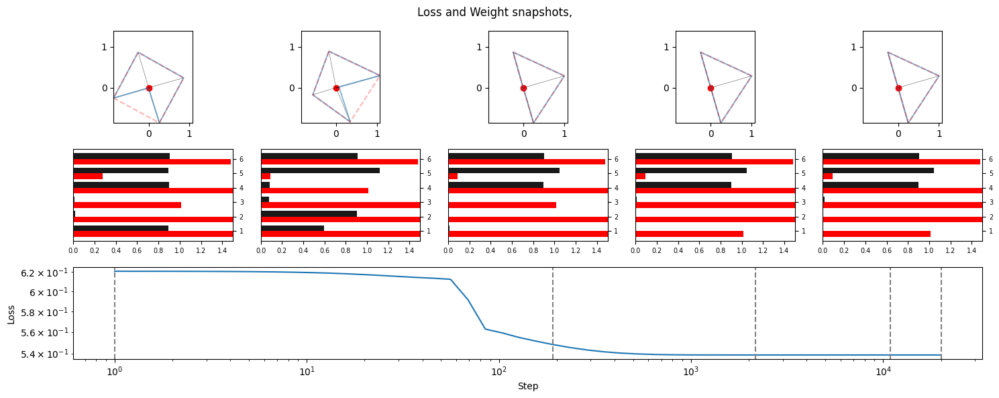

Loss: 0.5358073115348816


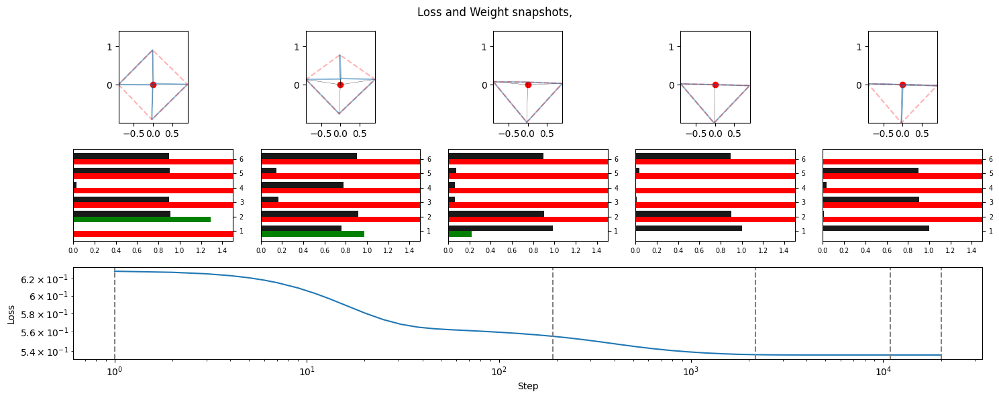

Loss: 0.5319010615348816


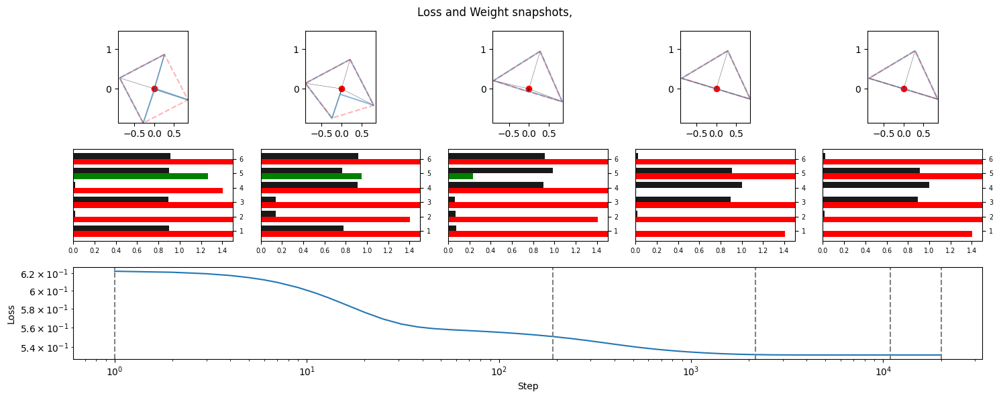

Loss: 0.541015625


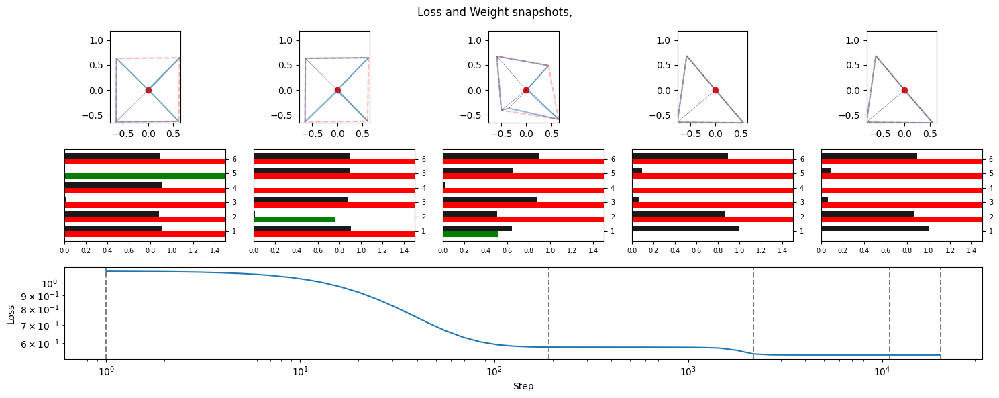

Loss: 0.5397135615348816


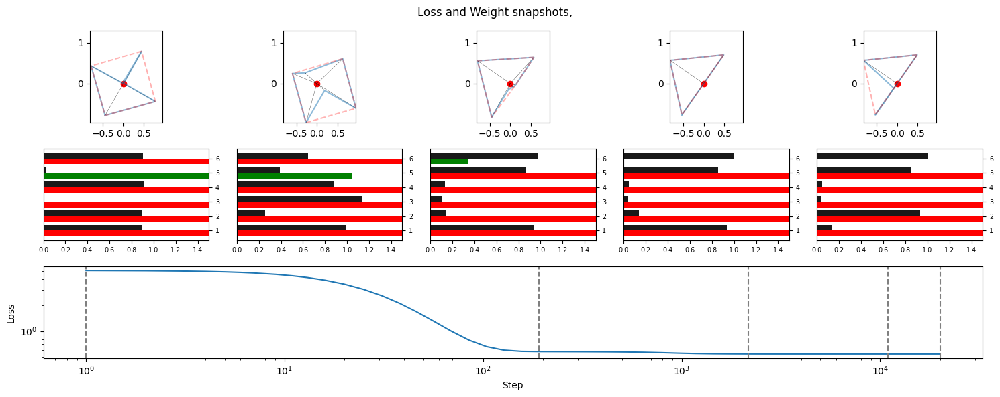

Loss: 0.54248046875


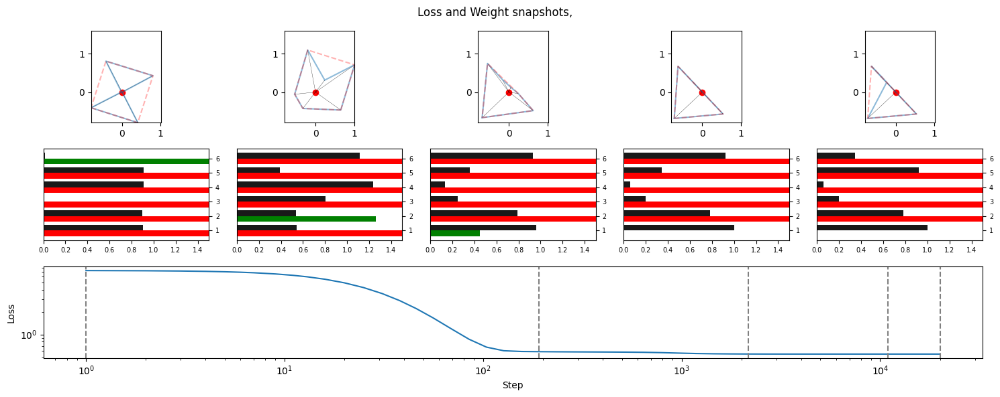

In [31]:
plot_results(results_random_init, plot_number=10, loss_window=(.5,.63), sparsities=[0.426])

Plot polygons for sparsity=0.426
Loss: 0.45310381054878235


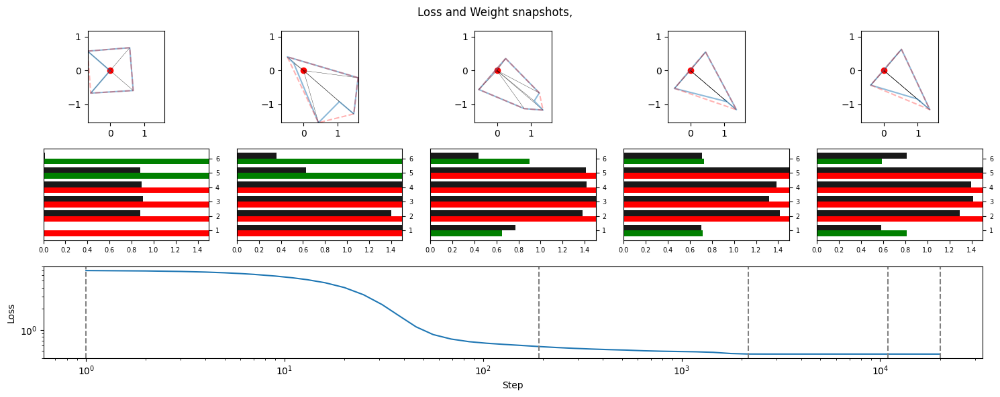

In [ ]:
plot_results(results_random_init, plot_number=20, loss_window=(.45,.5), sparsities=[0.426])

Plot polygons for sparsity=0.426
Loss: 0.4295247495174408


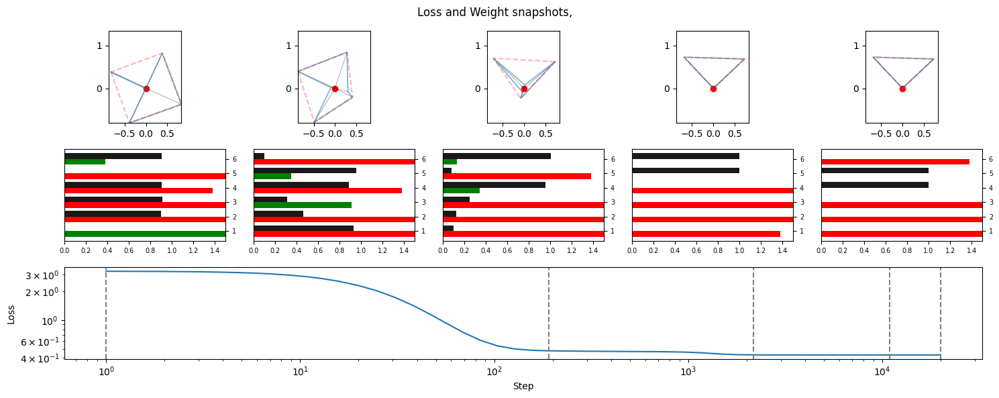

Loss: 0.42822265625


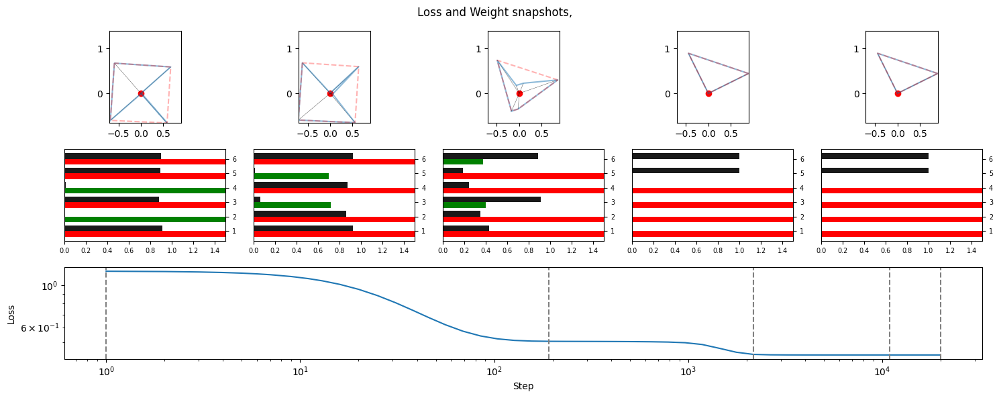

Loss: 0.4288736879825592


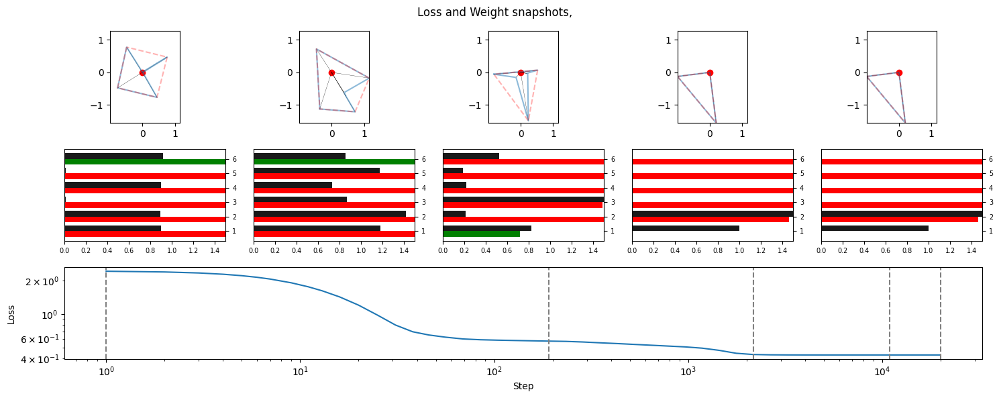

Loss: 0.4305013120174408


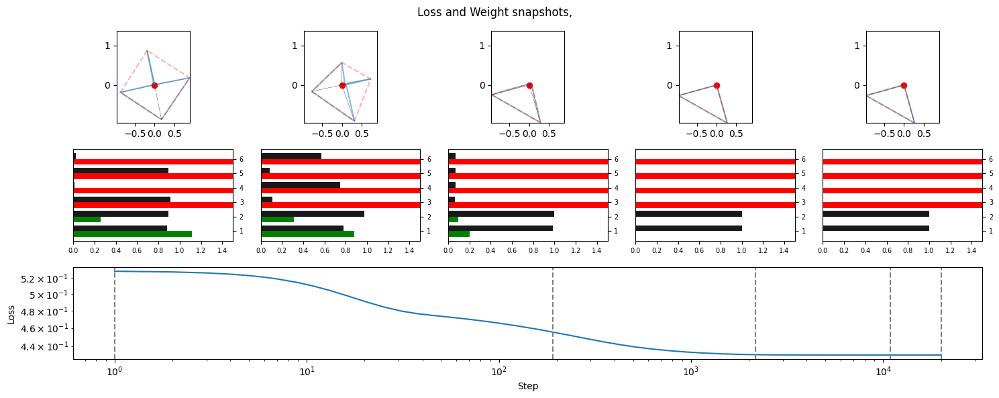

Loss: 0.4318033754825592


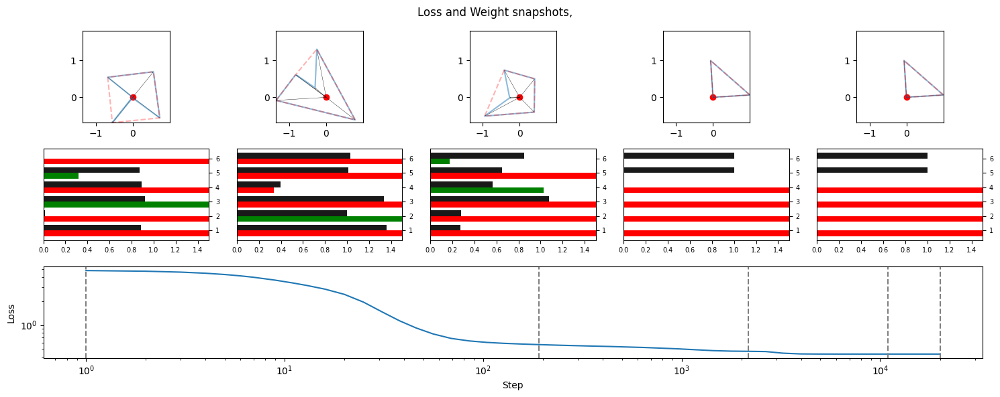

Loss: 0.4287109375


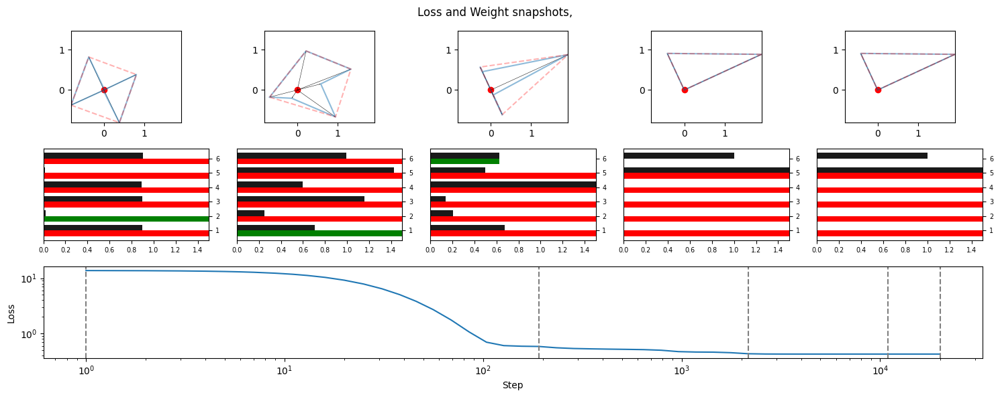

Loss: 0.4285481870174408


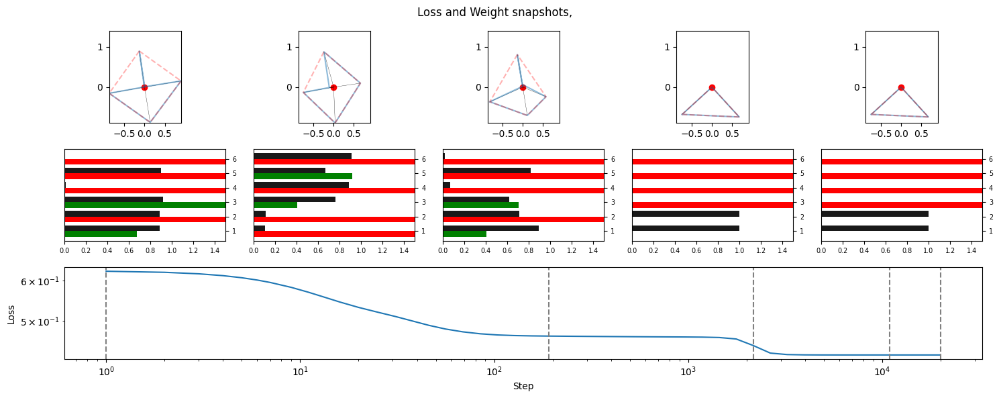

Loss: 0.4327799379825592


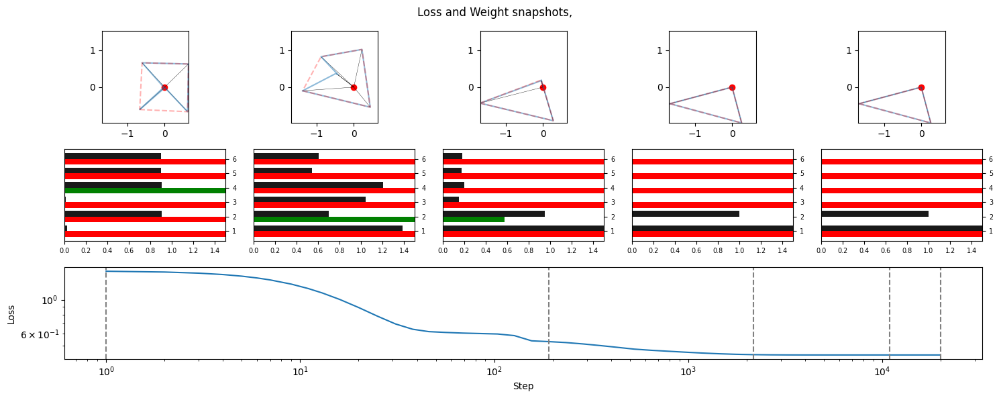

Loss: 0.4357096254825592


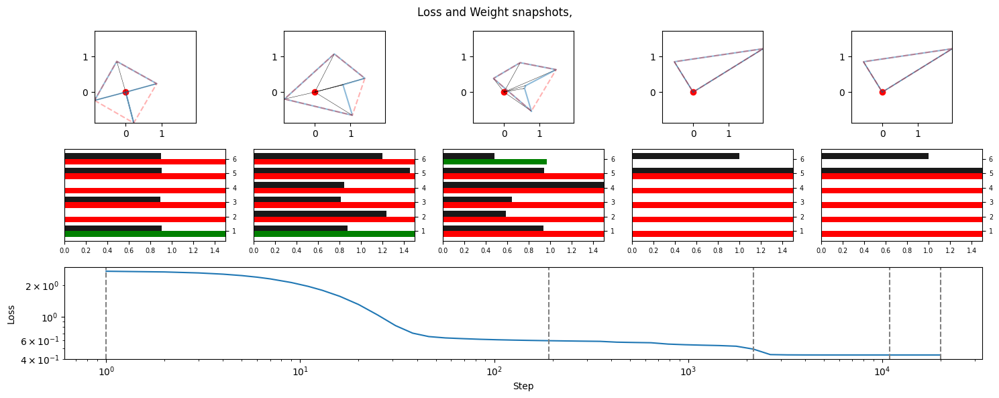

Loss: 0.4378255307674408


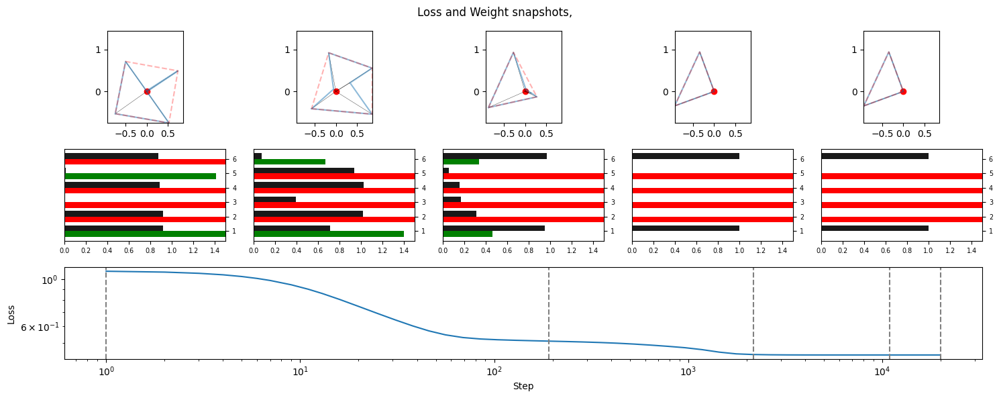

Loss: 0.4261067807674408


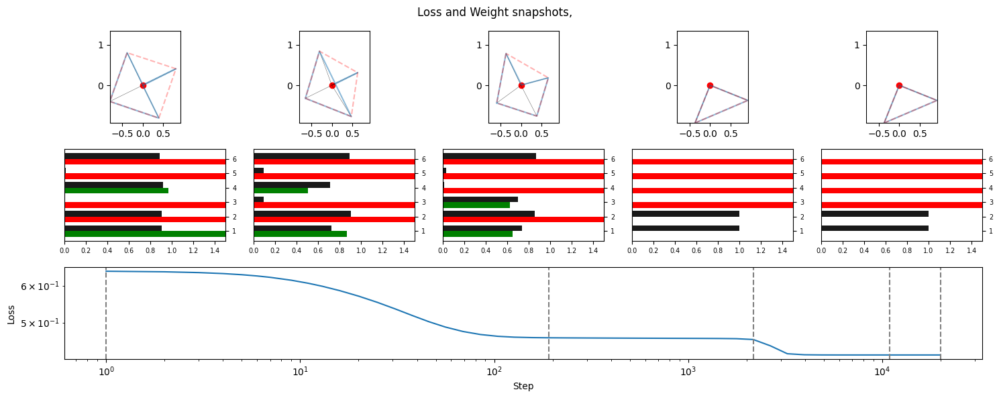

Loss: 0.4326171875


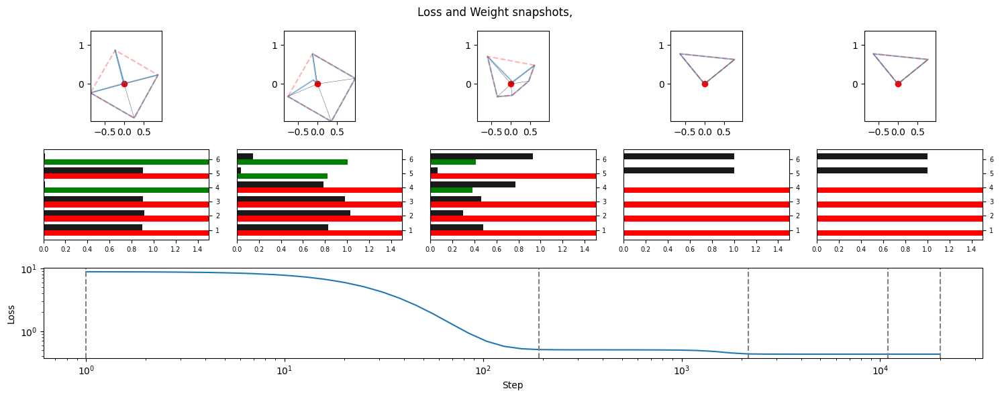

Loss: 0.4249674379825592


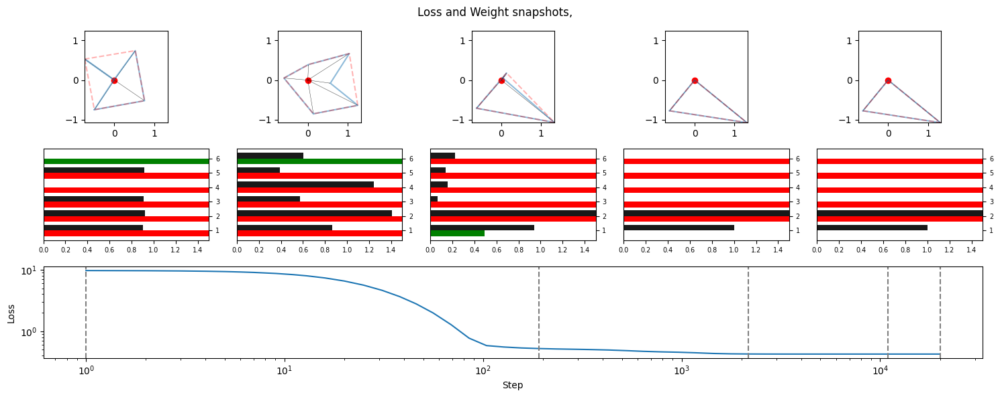

In [ ]:
plot_results(results_random_init, plot_number=20, loss_window=(.4,.45), sparsities=[0.426])

Plot polygons for sparsity=0.426
Loss: 0.39389440417289734


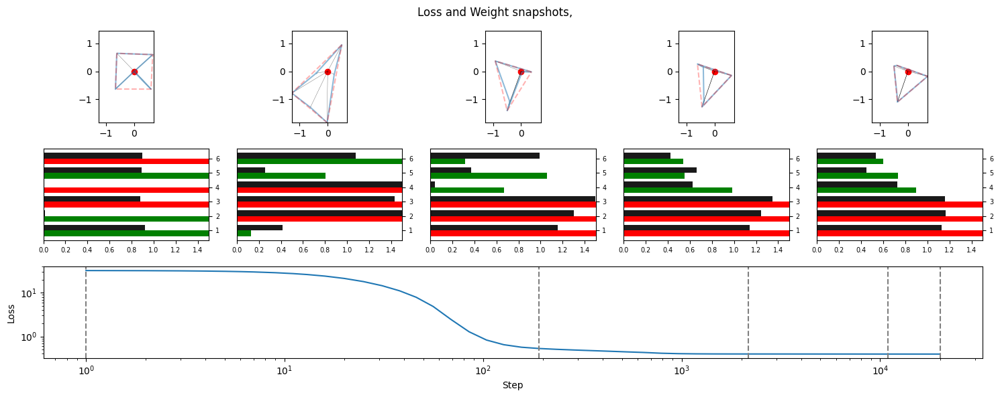

Loss: 0.39728617668151855


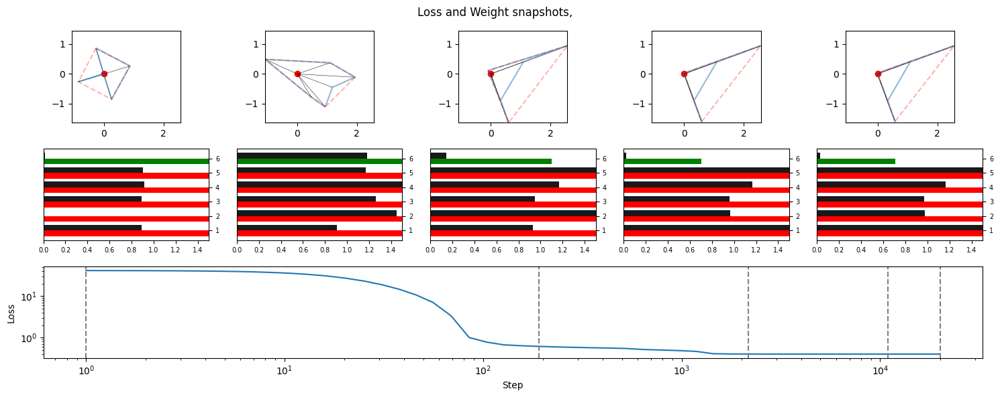

Loss: 0.39689159393310547


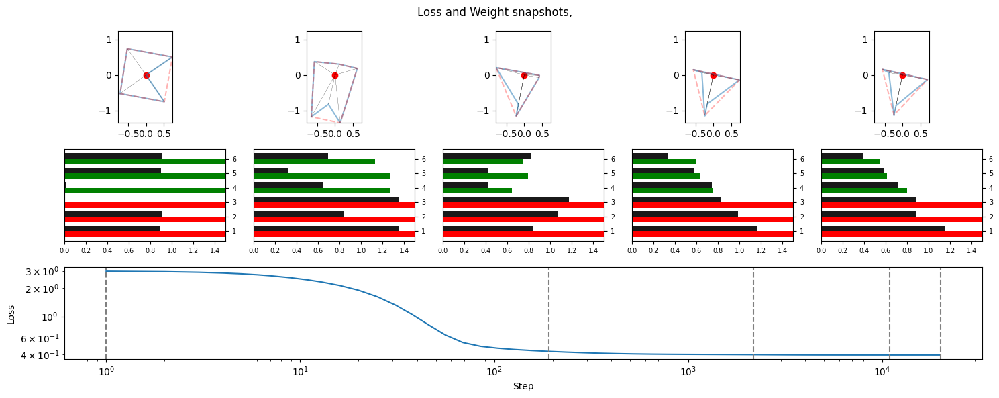

In [ ]:
plot_results(results_random_init, plot_number=5, loss_window=(.375,.4), sparsities=[0.426])

In [ ]:

plot_results(results_random_init, plot_number=1, loss_window=(0, 0.1375), sparsities=[0.426])

Plot polygons for sparsity=0.426


I am trying to see what types of solutions we see. Especially, I want to see the first non-sparse solution that does not look like the optimal solution. perhaps it would also help if we computed if the optimal solution was still useful.

Plot polygons for sparsity=0.938
Loss: 0.07962816208600998


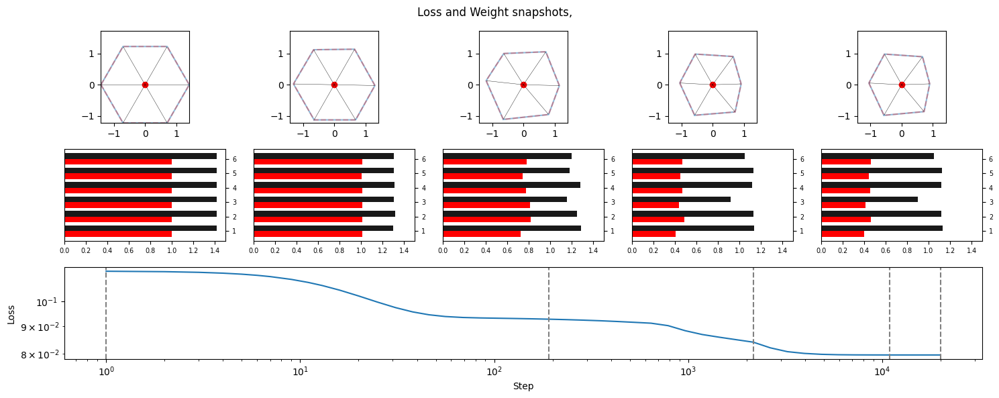

Loss: 0.06650777906179428


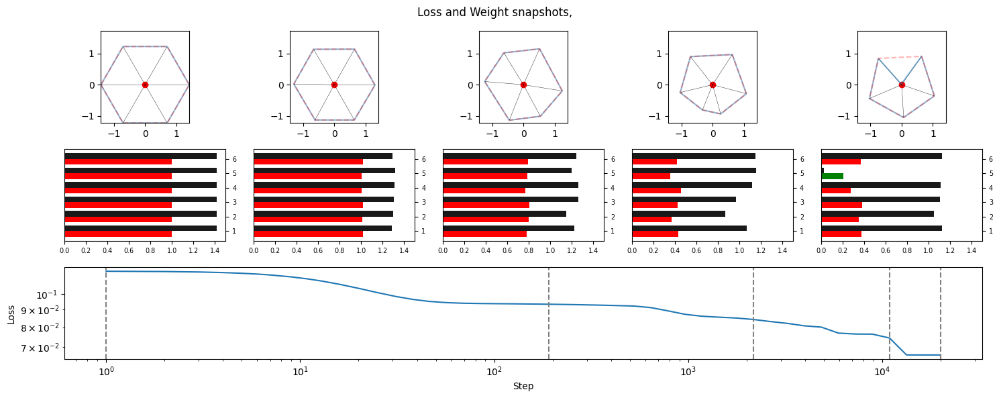

In [ ]:
plot_results(results_optimal_init, plot_number=2, loss_window=(0, 1), sparsities=[0.938])

In [ ]:

plot_results(results_optimal_init, plot_number=2, loss_window=(0, 1), sparsities=[0.993, 1])

In [24]:
def calculate_convex_hull_vertices(W):

    """
    Calculate the number of vertices of the convex hull of the points represented by the columns of W.
    
    Parameters:
    W (torch.Tensor): A 2xN matrix where each column represents a point in 2D space.
    
    Returns:
    int: The number of vertices of the convex hull.
    """
    if W.shape[0] != 2:
        raise ValueError("The weight matrix W must have 2 rows.")
    
    # Convert the tensor to a numpy array if it isn't already
    if isinstance(W, torch.Tensor):
        W = W.cpu().detach().numpy()
    
    hull = ConvexHull(W.T)
    return len(hull.vertices)  # The number of vertices is the same as the number of edges

def count_kgons(W):
    edge_counts = {}
    
    # Process each weight matrix
    for full_w in W:
        num_edges = classify_kgon(full_w)
        if num_edges in edge_counts:
            edge_counts[num_edges] += 1
        else:
            edge_counts[num_edges] = 1

    return edge_counts

def classify_5_gon(W, b, differentiate_5_plus=False):
    """
    Classify a 5-gon based on the weights and biases. 
    """

    # Convert tensor to numpy if it isn't already
    if isinstance(W, torch.Tensor):
        W = W.cpu().detach().numpy()
    
    if W.shape[0] == 2:
        W = W.T

    # Compute the convex hull
    hull = ConvexHull(W)
    
    # Check if the number of vertices is equal to 5
    if len(hull.vertices) != 5:
        return "not a 5-gon"
    
    # Convert biases to a numpy array if it isn't already
    if isinstance(b, torch.Tensor):
        b = b.cpu().detach().numpy()


    # Check if any of the non-vertex biases are large negative
    non_vertex_biases = np.delete(b, hull.vertices)

    # Check for any positive bias that is not part of the convex hull vertices
    non_hull_positive_bias = np.any(non_vertex_biases > 0)

    if not non_hull_positive_bias:
        return 5
    elif non_hull_positive_bias and differentiate_5_plus:
        return "5+"
    elif non_hull_positive_bias and not differentiate_5_plus:
        return 5
    else:

        return 'not a 5-gon'



def classify_kgon(W):
    embedding_w = W["embedding.weight"]
    edges = calculate_convex_hull_vertices(embedding_w)
    if edges == 5:
        return classify_5_gon(embedding_w, W["unembedding.bias"])
    return edges

In [25]:
def calculate_kgon_percentages(results, step =-1, sparsities= [0.426, 0.671, 0.811, 0.892, 0.938, 0.964, 0.98 , 0.988, 0.993], epsilon=0.001):
    # loss_hist = []
    for sparse_value in sparsities:
        plotted =0
        print(f"Plot polygons for sparsity={sparse_value}")
        weights = []

        STEPS = results[0]['parameters']['log_ivl']
        NUM_EPOCHS = 20000
        PLOT_STEPS = [min(STEPS, key=lambda s: abs(s-i)) for i in [0, 200, 2000, 10000, NUM_EPOCHS - 1]]
        PLOT_INDICES = [STEPS.index(s) for s in PLOT_STEPS]
        for PLOT_INDEX in range(len(STEPS)):
            weights = []
            for index in range(len(results)):
                non_matching_sparsity = abs(results[index]['parameters']['sparsity'] - sparse_value) > epsilon
                if non_matching_sparsity:
                    continue


                # Ws = [results[index]['weights'][i]['embedding.weight'] for i in PLOT_INDICES]
                # weights = [results[index]['weights'][i] for i in PLOT_INDICES]

                
                weights.append(results[index]['weights'][PLOT_INDEX])
            print(count_kgons(weights))

            


In [26]:
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

def plot_kgon_percentages(results, sparsities=[0.426, 0.671, 0.811, 0.892, 0.938, 0.964, 0.98, 0.988, 0.993], epsilon=0.001):
    STEPS = results[0]['parameters']['log_ivl']
    NUM_EPOCHS = 20000
    PLOT_STEPS = [min(STEPS, key=lambda s: abs(s - i)) for i in [0, 200, 2000, 10000, NUM_EPOCHS - 1]]
    PLOT_INDICES = [STEPS.index(s) for s in PLOT_STEPS]

    for sparse_value in sparsities:
        print(f"Processing sparsity = {sparse_value}")
        kgon_frequencies = []

        for step_idx in PLOT_INDICES:
            weights_at_step = []
            for result in results:
                if abs(result['parameters']['sparsity'] - sparse_value) > epsilon:
                    continue
                weights_at_step.append(result['weights'][step_idx])

            # Count kgons
            counts = count_kgons(weights_at_step)
            total = sum(counts.values())
            frequencies = {k: v / total * 100 for k, v in counts.items()}
            kgon_frequencies.append(frequencies)

        # Normalize keys (ensure all k-gon types are present in each step)
        all_kgons = sorted(set(k for freqs in kgon_frequencies for k in freqs))
        for freqs in kgon_frequencies:
            for k in all_kgons:
                freqs.setdefault(k, 0)

        # Convert to plot format
        plot_data = {k: [freqs[k] for freqs in kgon_frequencies] for k in all_kgons}

        # Plot
        plt.figure()
        for k, values in plot_data.items():
            plt.plot(PLOT_STEPS, values, label=f'{k}-gon')
        plt.title(f'% Frequency of k-gons over training steps\n(sparsity={sparse_value})')
        plt.xlabel('Training Step')
        plt.ylabel('Percentage Frequency')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(f'kgon_frequencies_sparsity_{sparse_value}.png', dpi=300)
        plt.show()


Processing sparsity = 0.426


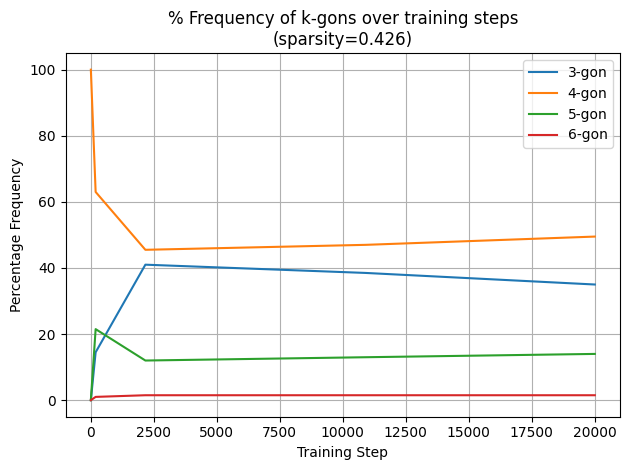

Processing sparsity = 0.671


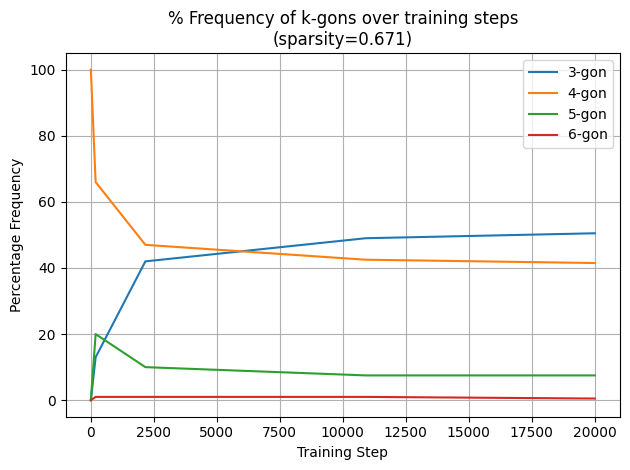

Processing sparsity = 0.811


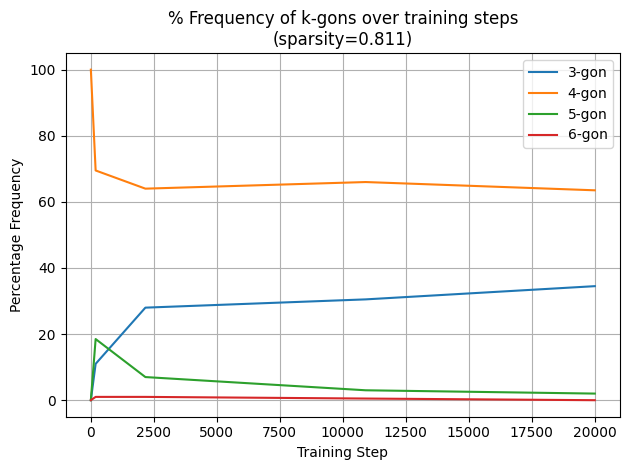

Processing sparsity = 0.892


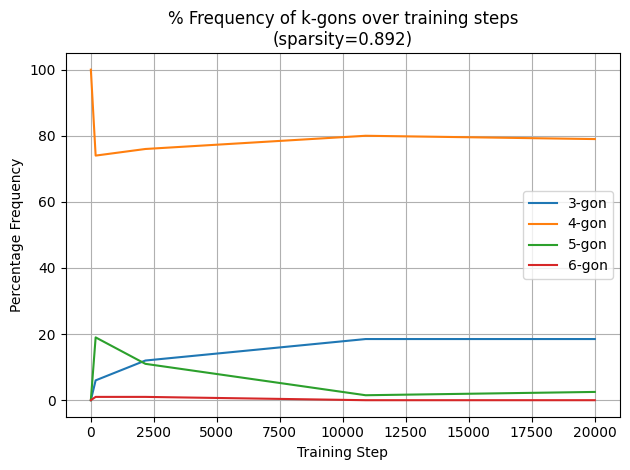

Processing sparsity = 0.938


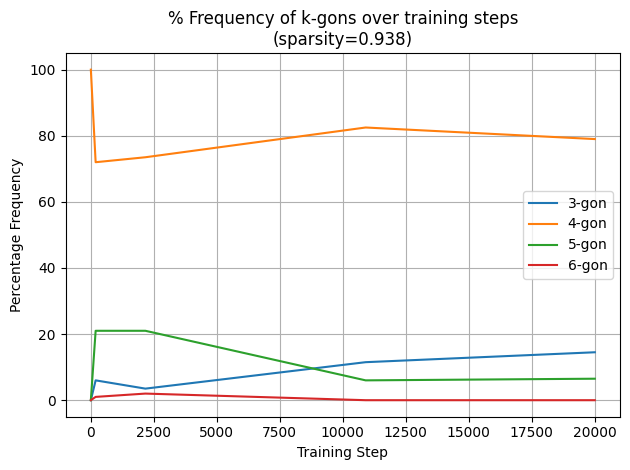

Processing sparsity = 0.964


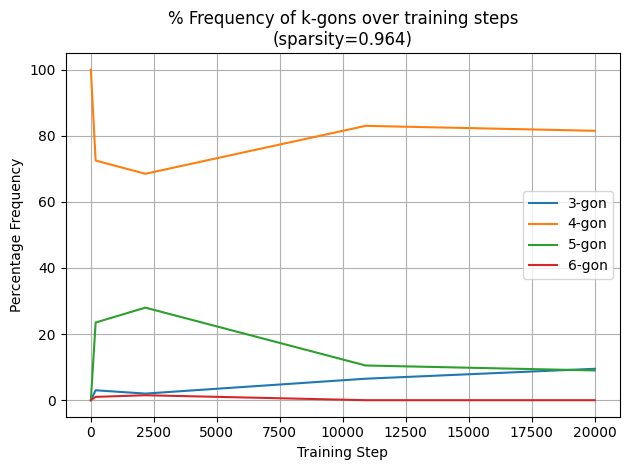

Processing sparsity = 0.98


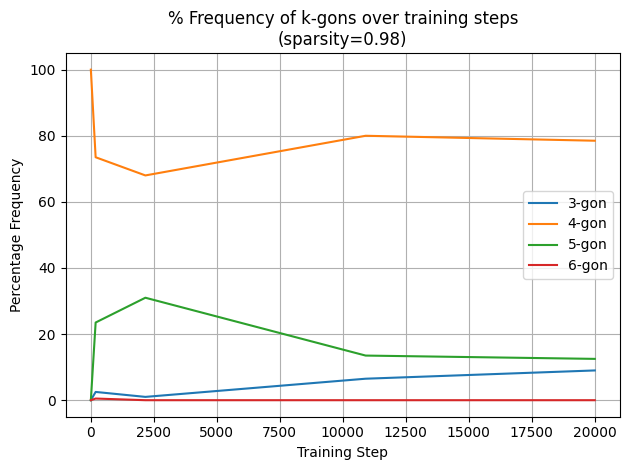

Processing sparsity = 0.988


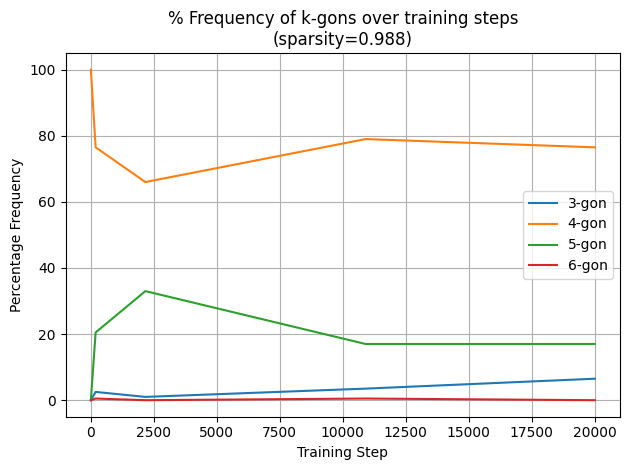

Processing sparsity = 0.993


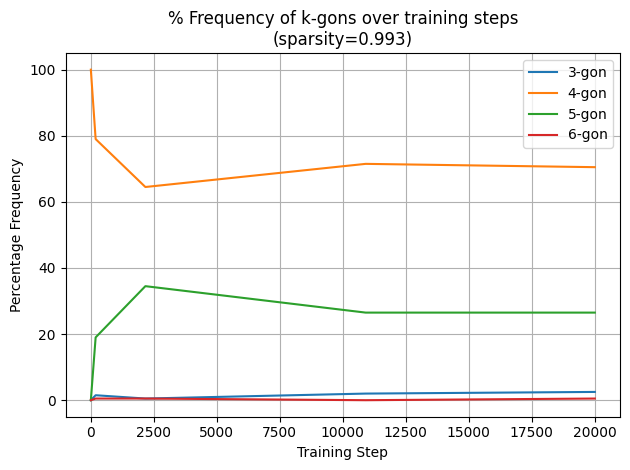

In [27]:
plot_kgon_percentages(
    results_1_13
)

Processing sparsity = 0.426


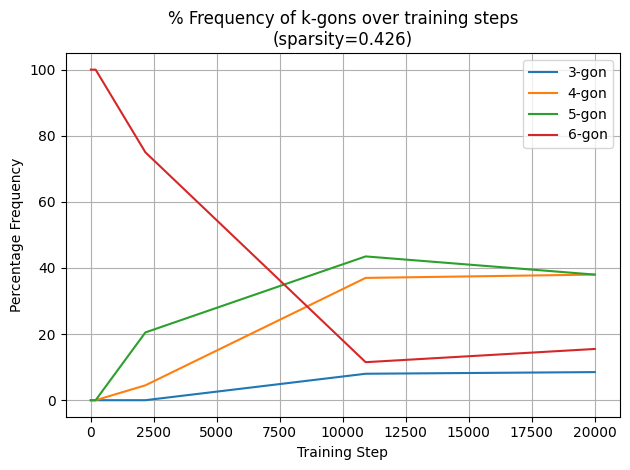

Processing sparsity = 0.671


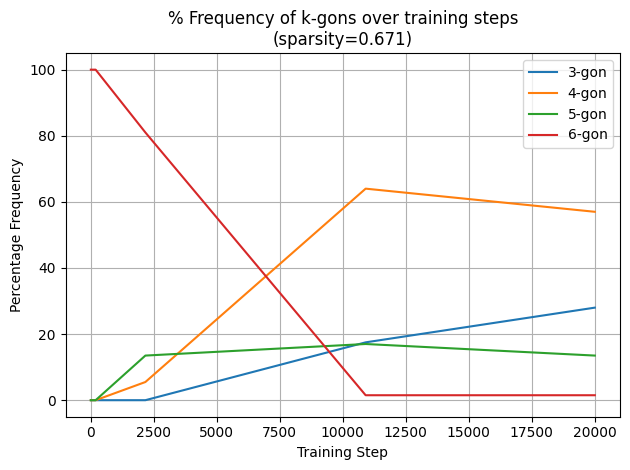

Processing sparsity = 0.811


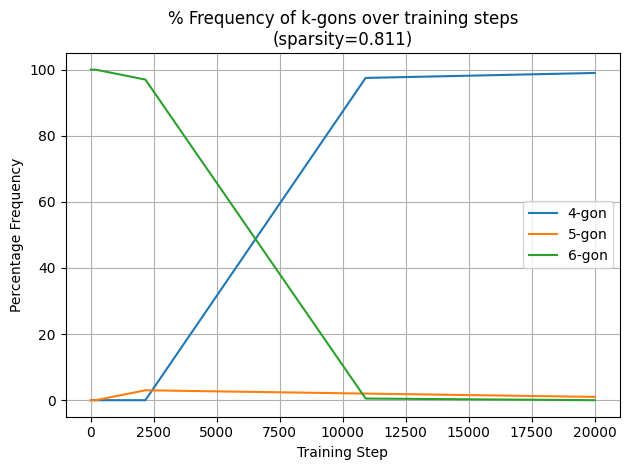

Processing sparsity = 0.892


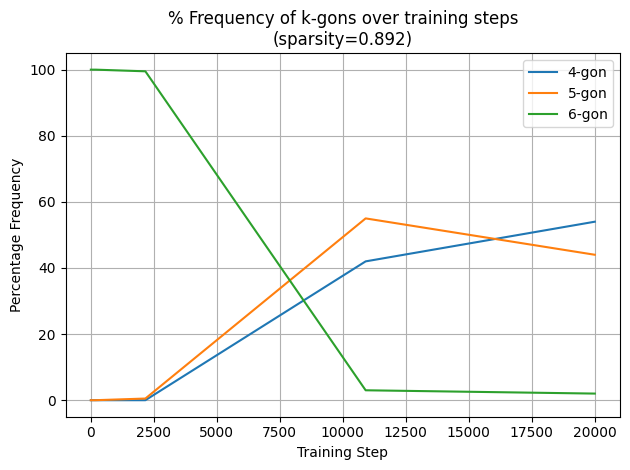

Processing sparsity = 0.938


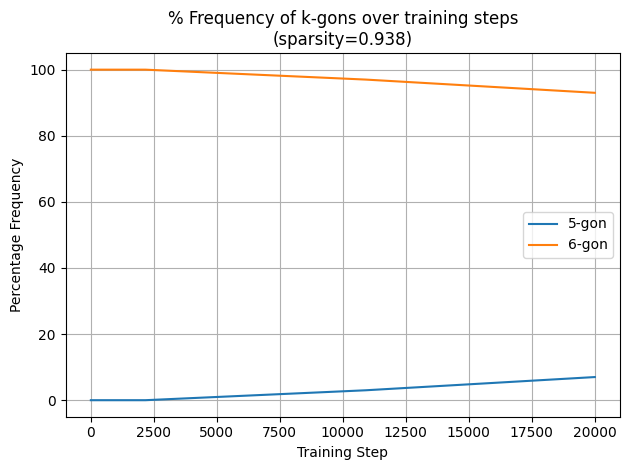

Processing sparsity = 0.964


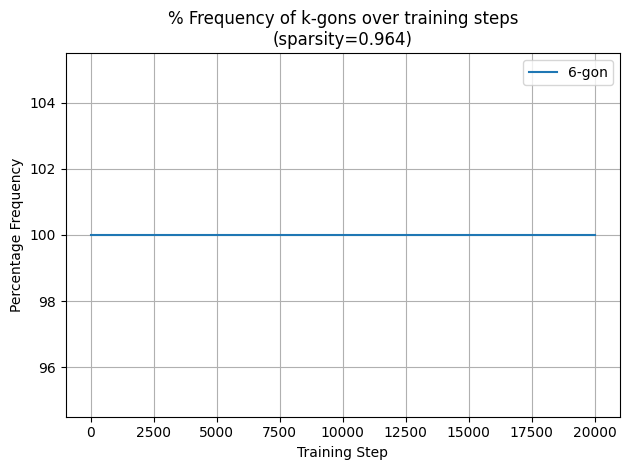

Processing sparsity = 0.98


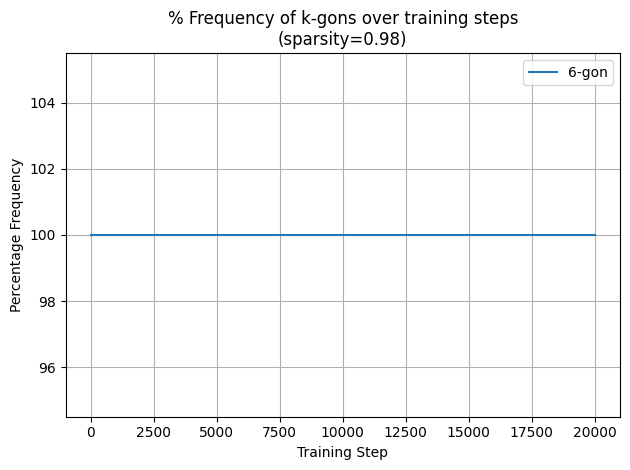

Processing sparsity = 0.988


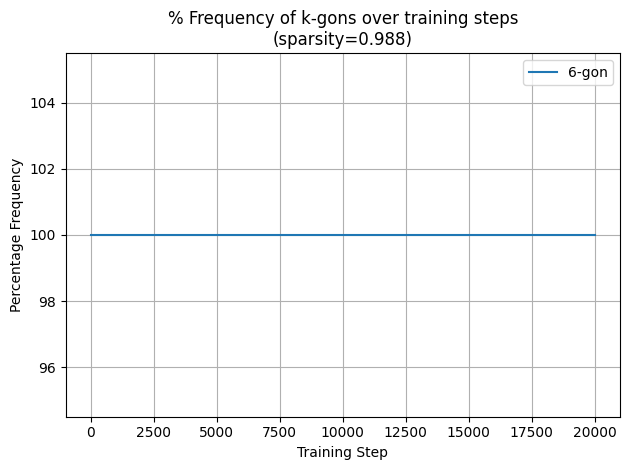

Processing sparsity = 0.993


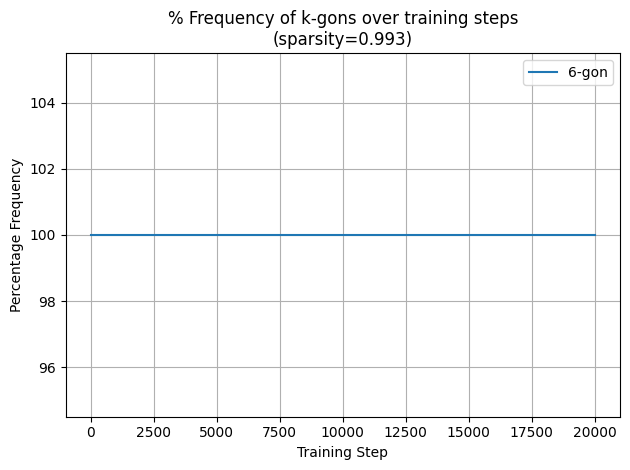

In [21]:
plot_kgon_percentages(
    results_optimal_init
)